# Camera mapping

To use the RGB images as labels for the IRCCAM data, we need a way to map the RGB view to the IRCCAM view. This notebook explores a few approaches to aligning the two views.

The first approach is to detect SIFT features (see [here](https://courses.cs.washington.edu/courses/cse455/09wi/Lects/lect6.pdf) or [here](https://arxiv.org/pdf/1710.02726.pdf)) in the two images, match corresponding features and align using the matches.

## IRCCAM data

In [11]:
import mat73 # scipy wouldn't load matlab 7.3 files
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
from matplotlib.pyplot import figure

In [13]:
idata = mat73.loadmat('../../data/raw/davos/cloudseg/irccam_20190816_rad.mat')

In [14]:
idata.keys()

dict_keys(['AZ', 'BT', 'CF', 'CLOUDS', 'CSFIT', 'CameraToffset', 'IRR', 'TM', 'ZA', 'alphadata', 'cloudheight', 'img', 'meteo', 'temp', 'temps', 'tempsstr', 'thor'])

In [15]:
imgnum = 600

In [16]:
idata['img'][:,:,imgnum]

array([[240.59251, 244.1211 , 247.93852, ..., 268.0701 , 269.1212 ,
        270.00278],
       [237.16144, 239.24812, 242.33423, ..., 269.27264, 270.05286,
        271.0733 ],
       [235.32957, 236.38731, 238.02786, ..., 270.3011 , 271.41345,
        272.78214],
       ...,
       [262.15884, 262.04288, 261.97452, ..., 223.55362, 223.64934,
        223.78435],
       [262.0303 , 261.9505 , 262.04398, ..., 223.53189, 223.56403,
        223.65323],
       [261.97092, 262.01633, 262.10037, ..., 223.52045, 223.58525,
        223.55249]], dtype=float32)

In [17]:
def plot_img(img):
    figure(num=None, figsize=(16, 12), dpi=80, facecolor='w', edgecolor='k')
    implot = plt.imshow(img, cmap='gray')

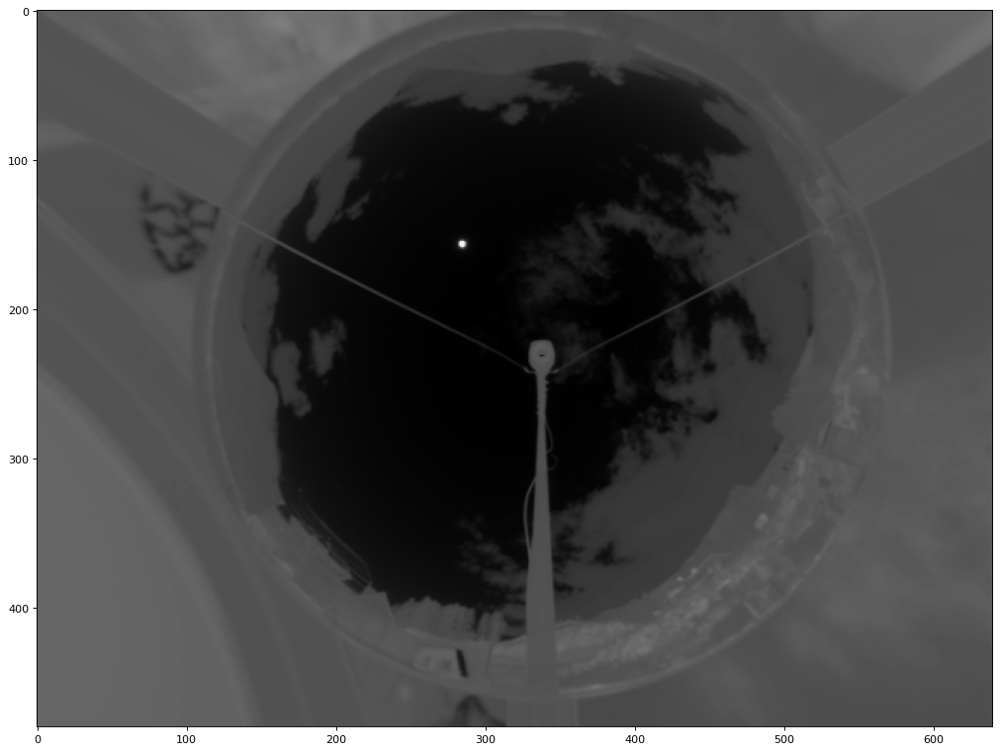

In [18]:
plot_img(idata['img'][:,:,600])

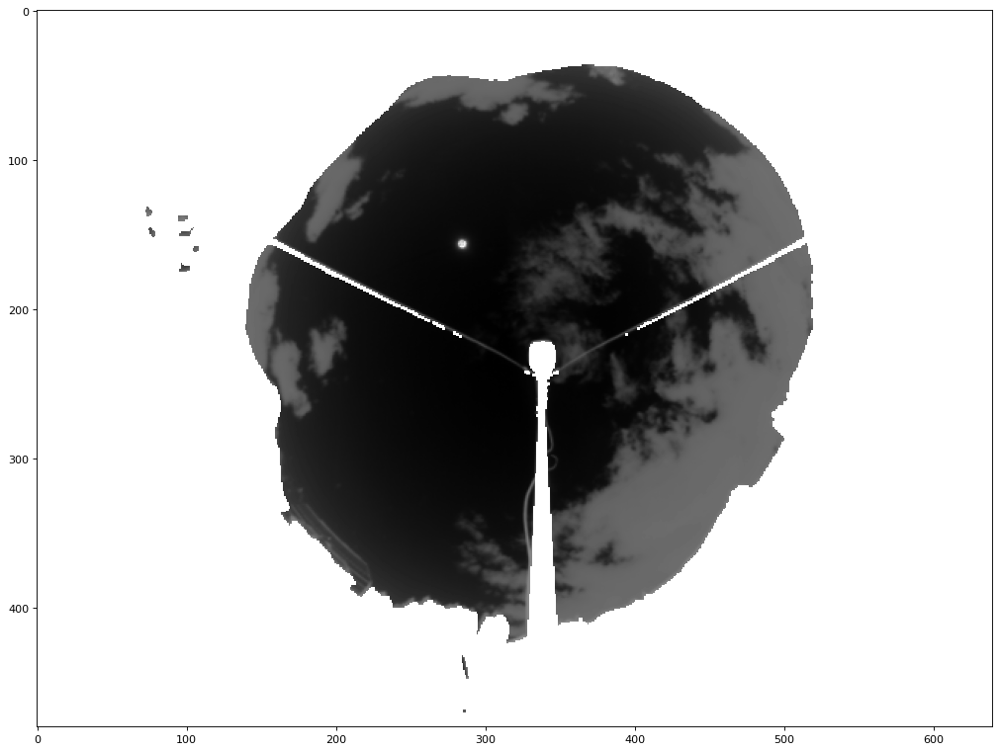

In [19]:
plot_img(idata['BT'][:,:,imgnum])

## RGB data

In [22]:
img = plt.imread('../../data/raw/davos/rgb/20190816/20190816100000_0.jpg')

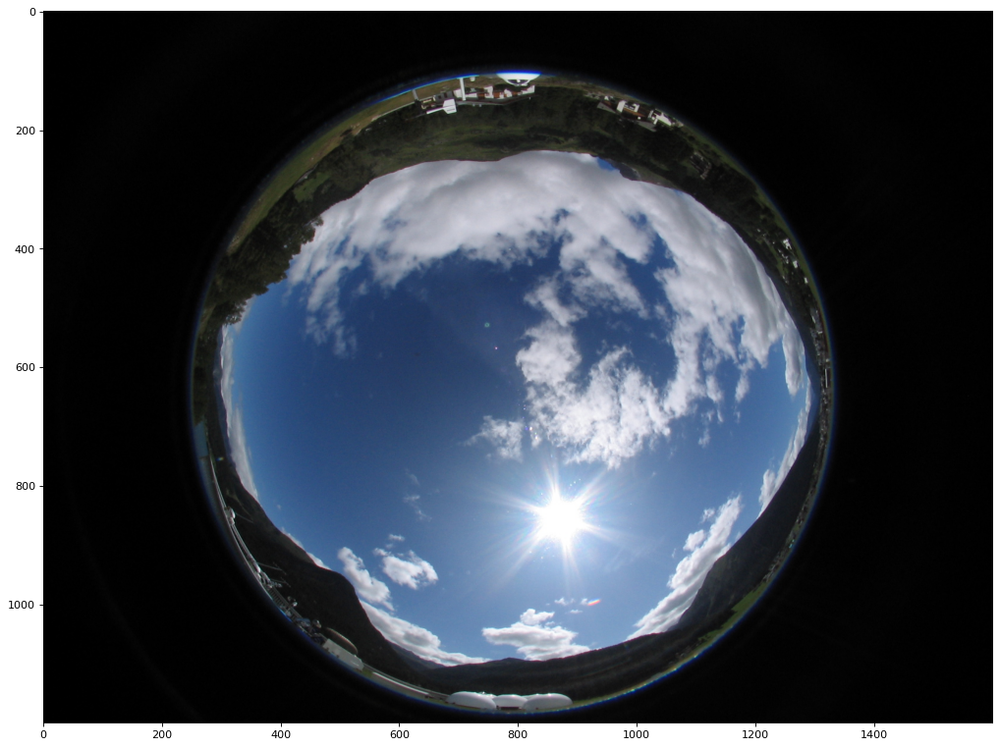

In [23]:
plot_img(img)

## SIFT feature mapping

In [24]:
import cv2

In [25]:
sift = cv2.SIFT_create()

In [30]:
img = cv2.imread('../../data/raw/davos/rgb/20190816/20190816100000_0.jpg')
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(gray,None)
imgkp = cv2.drawKeypoints(gray,kp,img)

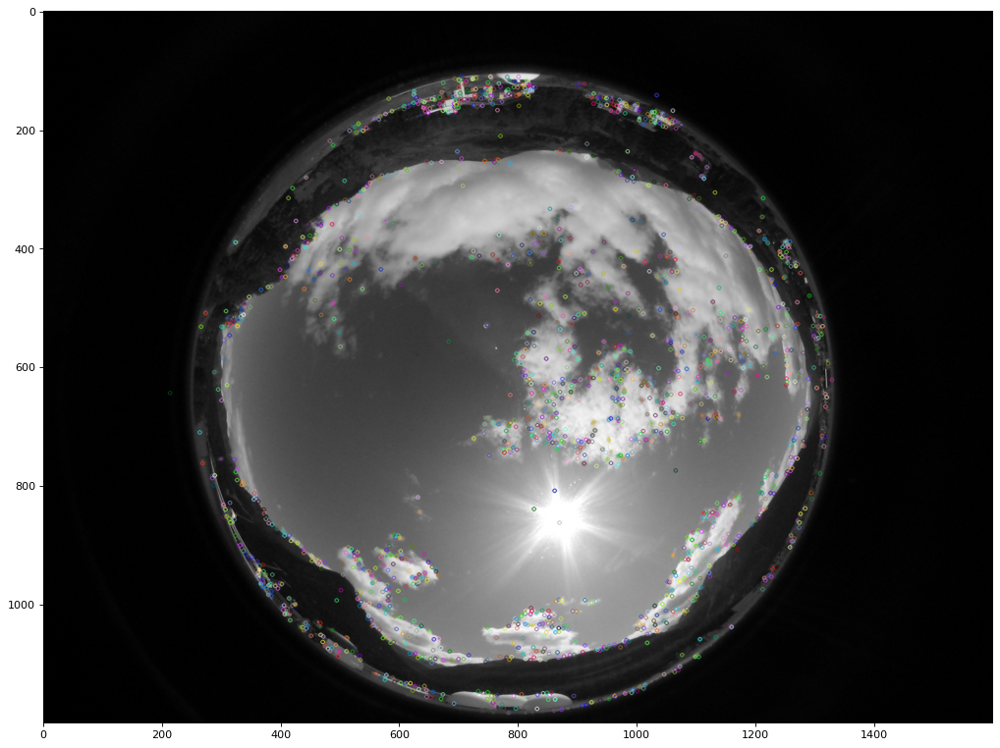

In [31]:
plot_img(imgkp)

In [32]:
ir_600 = idata['img'][:,:,600]
gray_ir = ir_600 - ir_600.min()
gray_ir *= (255.0/gray_ir.max())
gray_ir = np.array(gray_ir.round(), dtype = np.uint8)

sift = cv2.SIFT_create()
kp_ir = sift.detect(gray_ir,None)
imgkp_ir = cv2.drawKeypoints(gray_ir,kp_ir,None)

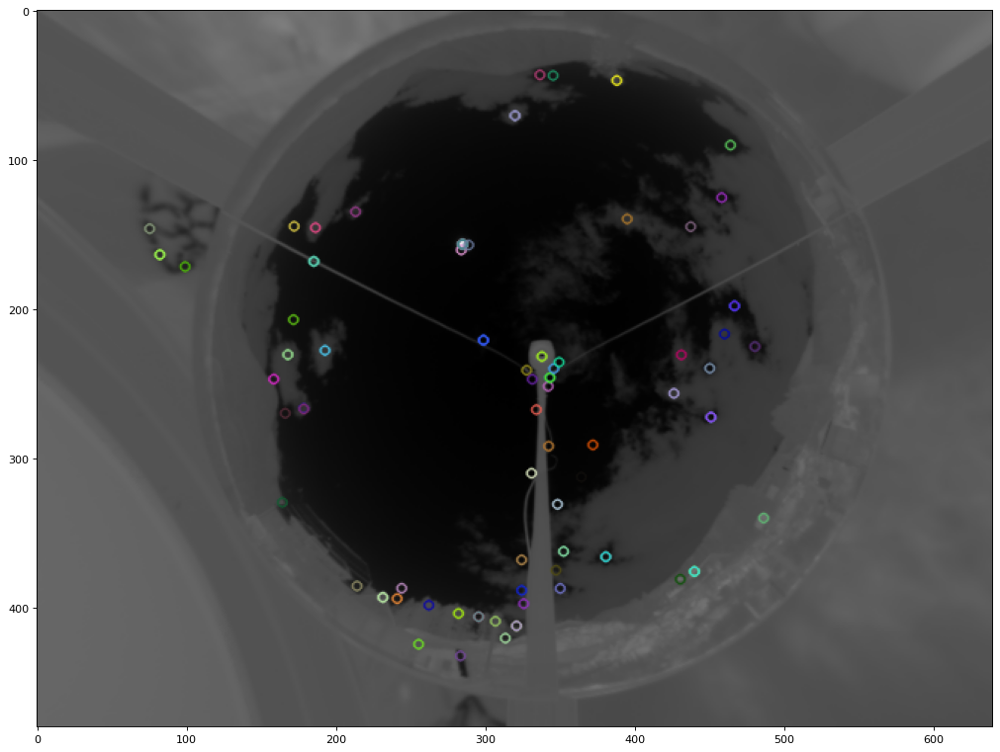

In [33]:
plot_img(imgkp_ir)

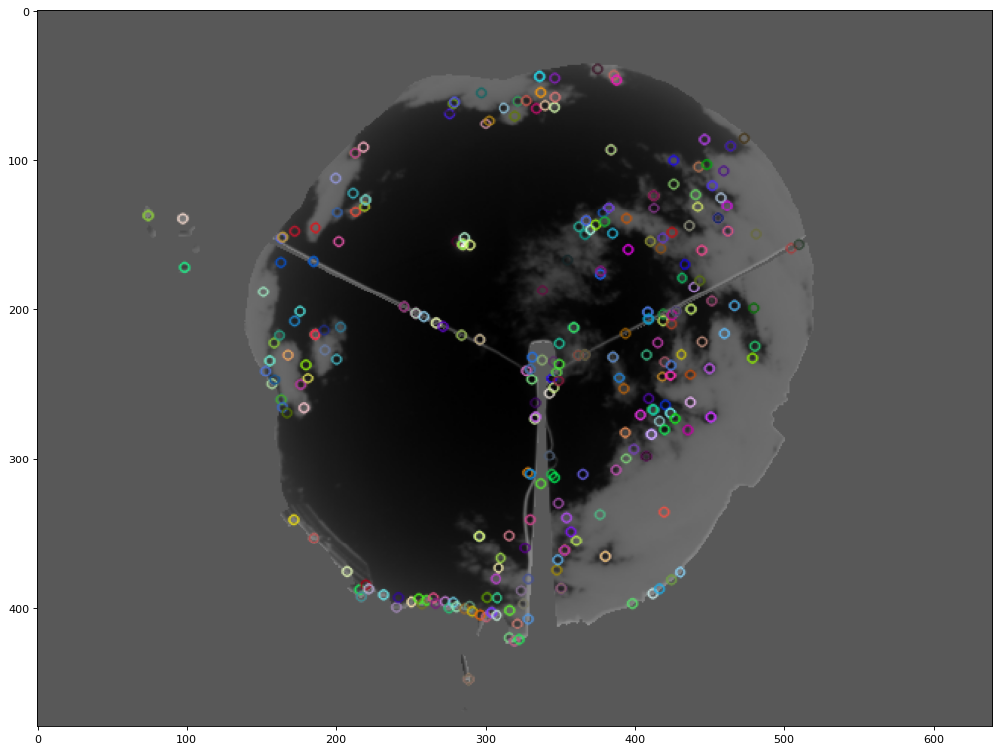

In [34]:
ir_600 = np.nan_to_num(idata['BT'][:,:,600])
gray_ir = ir_600 - ir_600.min()
gray_ir *= (255.0/gray_ir.max())
gray_ir = np.array(gray_ir.round(), dtype = np.uint8)

sift = cv2.SIFT_create()
kp_ir, des_ir = sift.detectAndCompute(gray_ir,None)
imgkp_ir = cv2.drawKeypoints(gray_ir,kp_ir,None)
plot_img(imgkp_ir)

## Crop to square 

In [35]:
def crop_irrcam_img(img):
    crop_img = img[20:440, 120:540]
    return crop_img

def crop_vis_img(img):
    crop_img = img[50:470, 105:525]
    return crop_img

def scale_vis_img(img):
    scale_img = cv2.resize(img, (640, 480))
    return scale_img

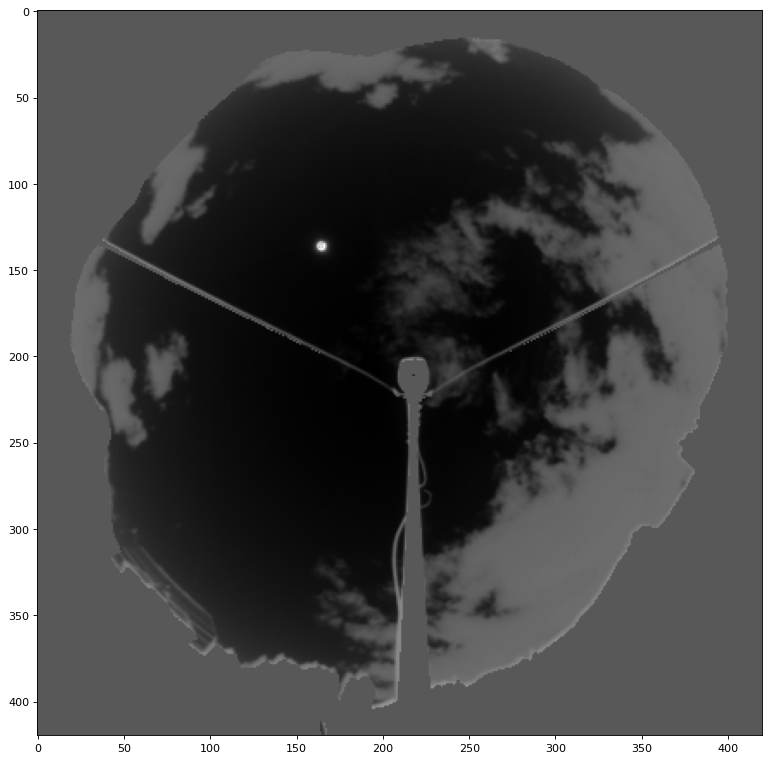

In [36]:
cropped_ir = crop_irrcam_img(gray_ir)
plot_img(cropped_ir)

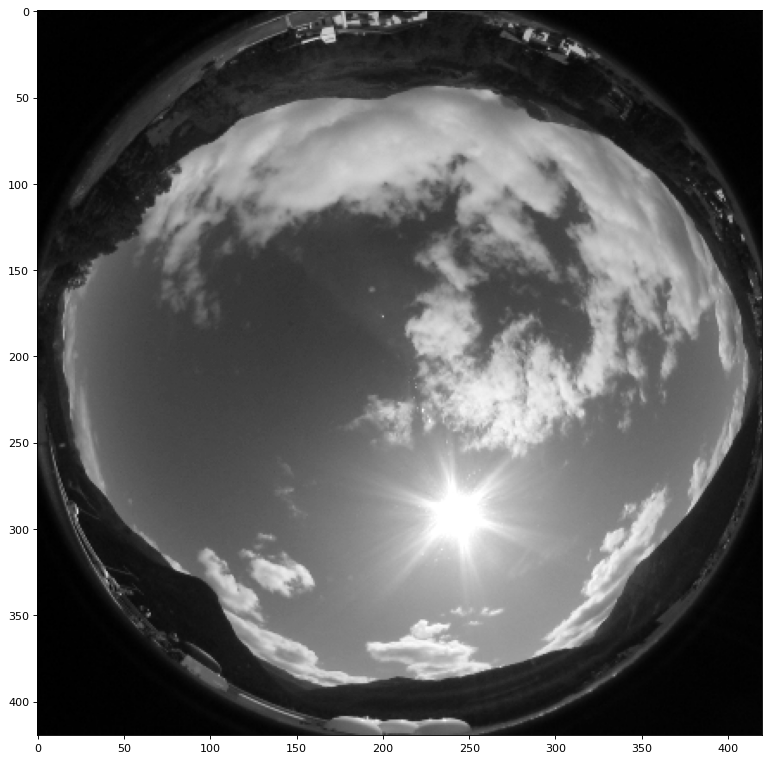

In [37]:
scaled_rgb = scale_vis_img(gray)
cropped_rgb = crop_vis_img(scaled_rgb)
plot_img(cropped_rgb)

## Rotate and flip rgb images

In [38]:
# from https://stackoverflow.com/a/23316542
def rotate_image(image, angle):
    row,col = image.shape
    center=tuple(np.array([row,col])/2)
    rot_mat = cv2.getRotationMatrix2D(center,angle,1.0)
    new_image = cv2.warpAffine(image, rot_mat, (col,row))
    return new_image

def flip_and_rotate_vis_img(img):
    flip_img = cv2.flip(img, 1)
    rotate_img = rotate_image(flip_img, -130)
    return rotate_img

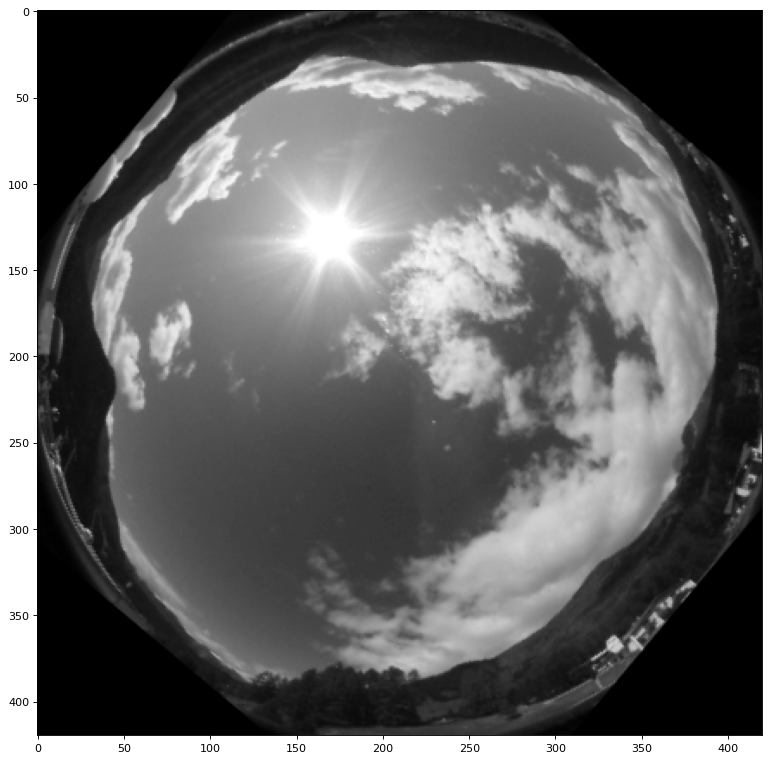

In [39]:
flipped_rgb = flip_and_rotate_vis_img(cropped_rgb)
plot_img(flipped_rgb)

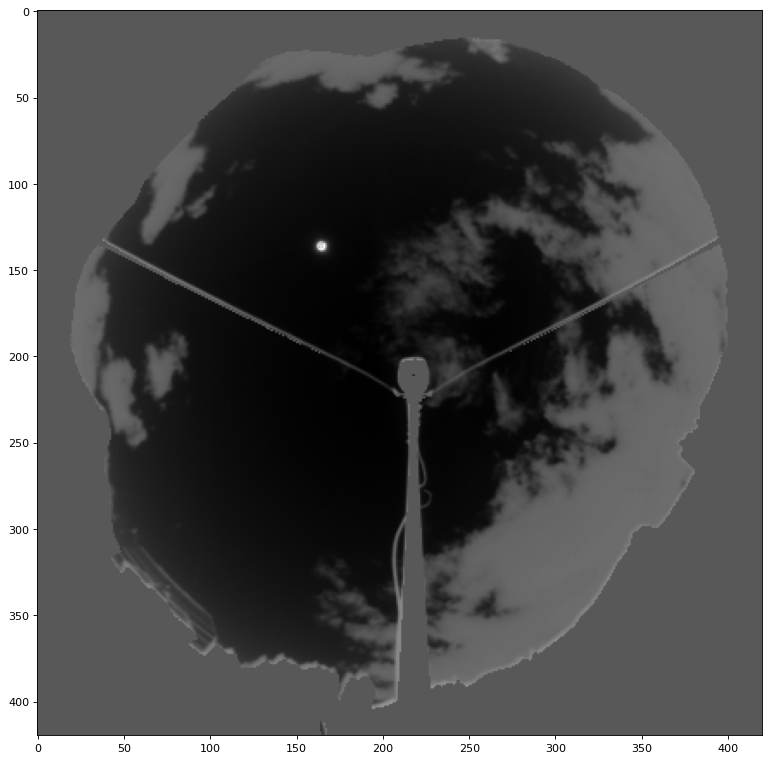

In [40]:
plot_img(cropped_ir)

## Full pre-processing

In [46]:
import datetime

def get_irccam_img(img_num):
    img_ir = np.nan_to_num(idata['BT'][:,:,img_num])
    gray_ir = img_ir - img_ir.min()
    gray_ir *= (255.0/gray_ir.max())
    gray_ir = np.array(gray_ir.round(), dtype = np.uint8)
    return gray_ir

def process_irccam_img(img):
    cropped_ir = crop_irrcam_img(img)
    return cropped_ir

def get_vis_img(img_num):
    time_str = (datetime.datetime(2019,8,16,0,1,0) + datetime.timedelta(minutes=img_num)).strftime('%Y%m%d%H%M')
    img_vis = cv2.imread('../../data/raw/davos/rgb/20190816/{}00_0.jpg'.format(time_str))
    gray_vis = cv2.cvtColor(img_vis,cv2.COLOR_BGR2GRAY)
    return gray_vis

def process_vis_img(img):
    processed_vis = scale_vis_img(img)
    processed_vis = crop_vis_img(processed_vis)
    processed_vis = flip_and_rotate_vis_img(processed_vis)
    return processed_vis

def get_processed_ir_img(img_num):
    img_ir = get_irccam_img(img_num)
    img_ir = process_irccam_img(img_ir)
    return img_ir

def get_processed_vis_img(img_num):
    img_vis = get_vis_img(img_num)
    img_vis = process_vis_img(img_vis)
    return img_vis

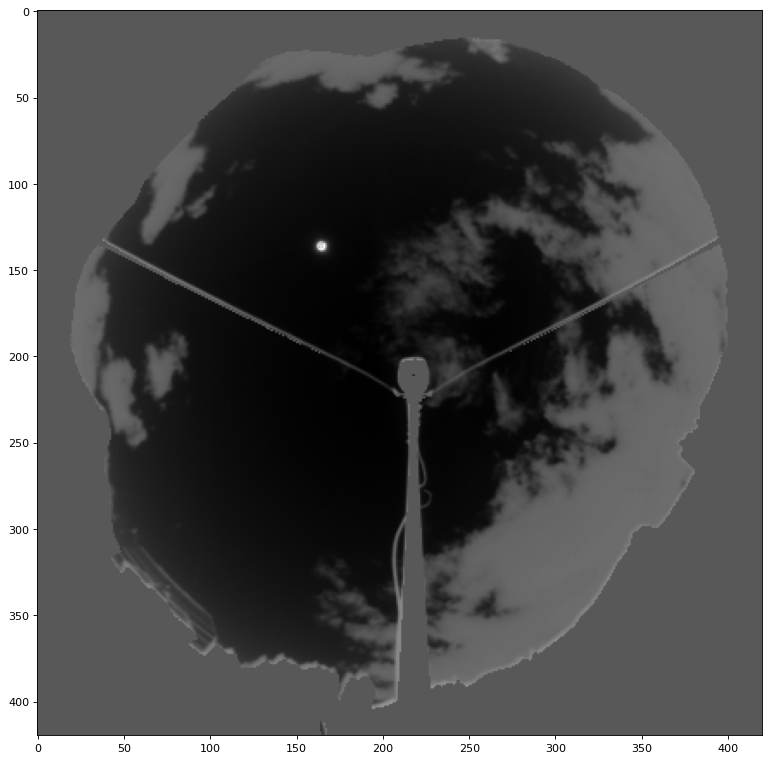

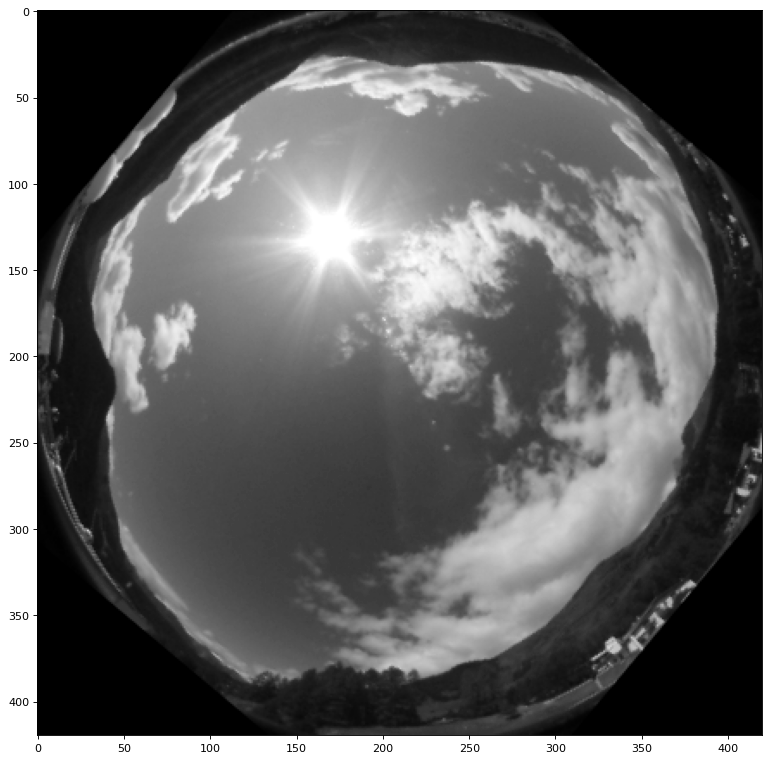

In [47]:
img_ir = get_processed_ir_img(600)
img_vis = get_processed_vis_img(600)
plot_img(img_ir)
plot_img(img_vis)

## SIFT matches

In [48]:
img_ir = get_processed_ir_img(600)
img_vis = get_processed_vis_img(600)

sift = cv2.SIFT_create()
kp_vis, des_vis = sift.detectAndCompute(img_vis, None)
kp_ir, des_ir = sift.detectAndCompute(img_ir, None)

matcher = cv2.BFMatcher()
kp_matches = matcher.match(des_vis, des_ir)

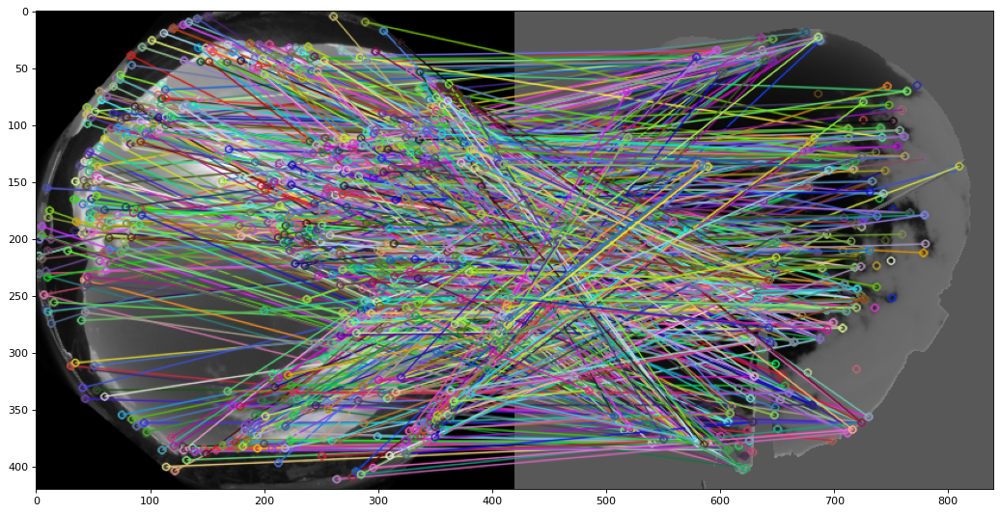

In [49]:
# Plot all matches

match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,kp_matches,None)
plot_img(match_img)

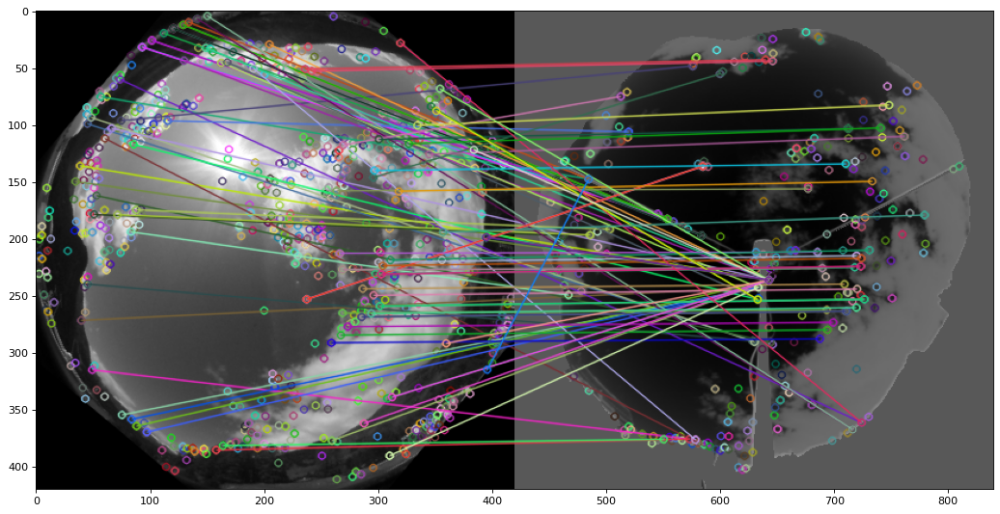

In [50]:
# Plot close matches

match_dist = np.array([a.distance for a in kp_matches])
close_matches = np.delete(kp_matches,np.where(match_dist>200))

close_match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,close_matches, None)
plot_img(close_match_img)

### Comment

This approach does not seem very successful. Most matches seem incorrect.

## Try a cropped area

In [51]:
img_ir = get_processed_ir_img(600)[80:360, 80:360]
img_vis = get_processed_vis_img(600)[80:360, 80:360]

sift = cv2.SIFT_create()
kp_vis, des_vis = sift.detectAndCompute(img_vis, None)
kp_ir, des_ir = sift.detectAndCompute(img_ir, None)

matcher = cv2.BFMatcher()
kp_matches = matcher.match(des_vis, des_ir)

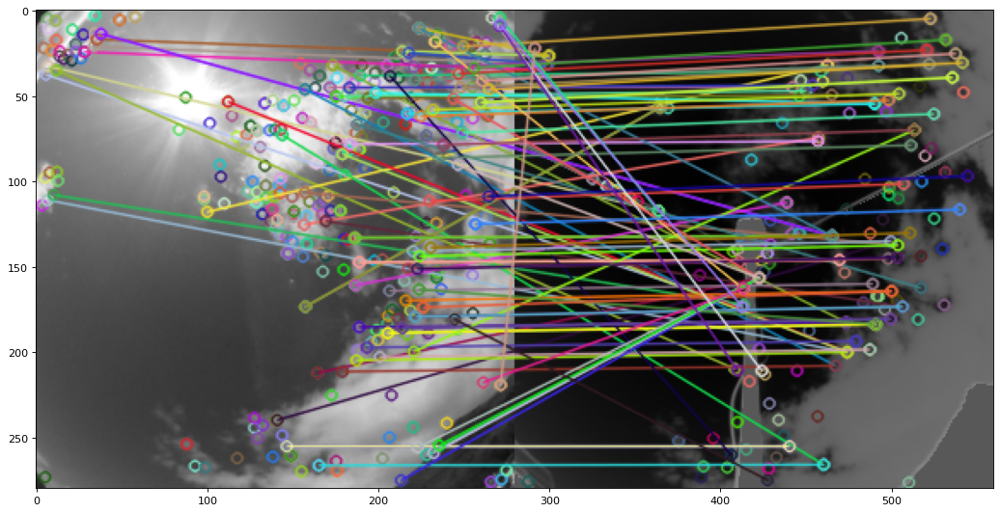

In [52]:
# Plot close matches

match_dist = np.array([a.distance for a in kp_matches])
close_matches = np.delete(kp_matches,np.where(match_dist>300))

close_match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,close_matches,None)
plot_img(close_match_img)

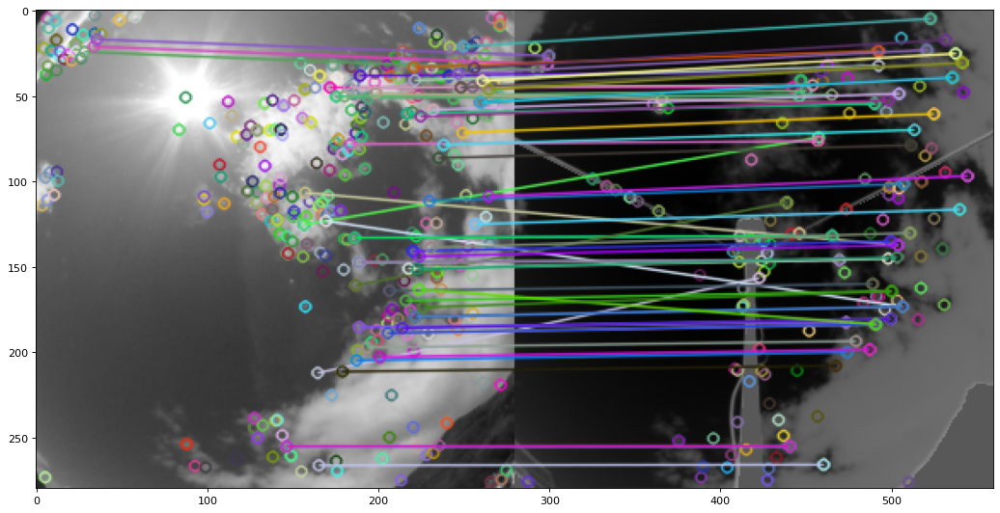

In [53]:
## Filter out matches that are far away
pixel_dist = np.array([np.linalg.norm(np.array(kp_vis[m.queryIdx].pt) - np.array(kp_ir[m.trainIdx].pt)) for m in close_matches])
closer_matches = close_matches[np.where(pixel_dist < 100)]

close_match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,closer_matches,None)
plot_img(close_match_img)

### Comment
Ahh, this is looking much better, there are some actual correct matches in there! Might need to use an algo like RANSAC to choose best matches.

## RANSAC

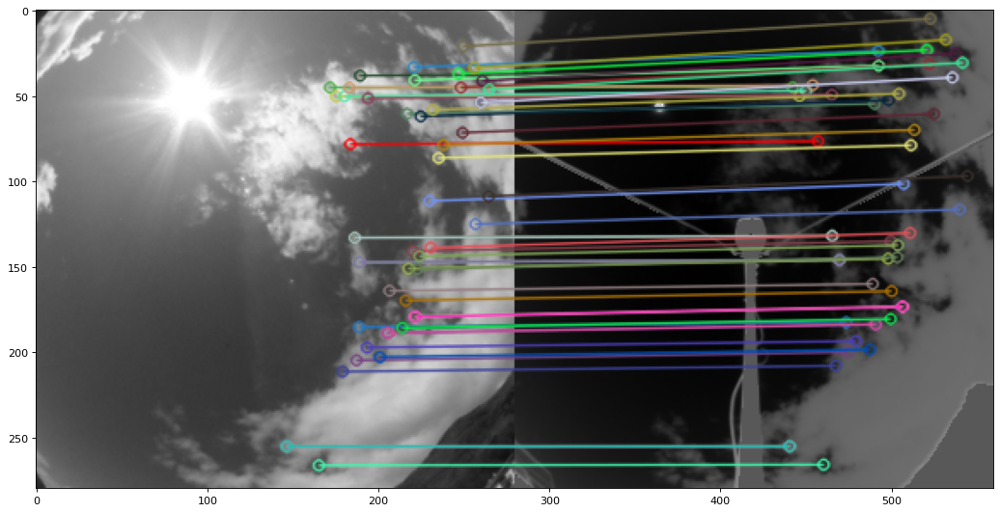

In [54]:
# Adapted from https://docs.opencv.org/master/d1/de0/tutorial_py_feature_homography.html
src_pts = np.float32([ kp_vis[m.queryIdx].pt for m in closer_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_ir[m.trainIdx].pt for m in closer_matches ]).reshape(-1,1,2)

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 10.0)
draw_params = dict(matchesMask=mask.ravel().tolist(), flags=2)
close_match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,closer_matches,None, **draw_params)
plot_img(close_match_img)

### Comment

Looking much better!

## Full image again

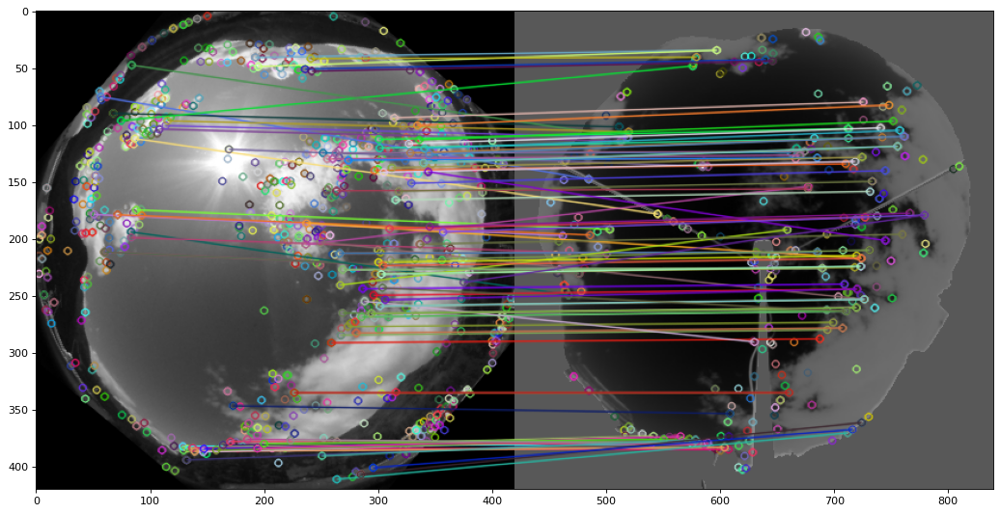

In [55]:
img_ir = get_processed_ir_img(600)
img_vis = get_processed_vis_img(600)

sift = cv2.SIFT_create()
kp_vis, des_vis = sift.detectAndCompute(img_vis, None)
kp_ir, des_ir = sift.detectAndCompute(img_ir, None)

matcher = cv2.BFMatcher()
kp_matches = matcher.match(des_vis, des_ir)

match_dist = np.array([a.distance for a in kp_matches])
close_matches = np.delete(kp_matches,np.where(match_dist>300))

pixel_dist = np.array([np.linalg.norm(np.array(kp_vis[m.queryIdx].pt) - np.array(kp_ir[m.trainIdx].pt)) for m in close_matches])
close_matches = close_matches[np.where(pixel_dist < 100)]

close_match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,close_matches, None)
plot_img(close_match_img)

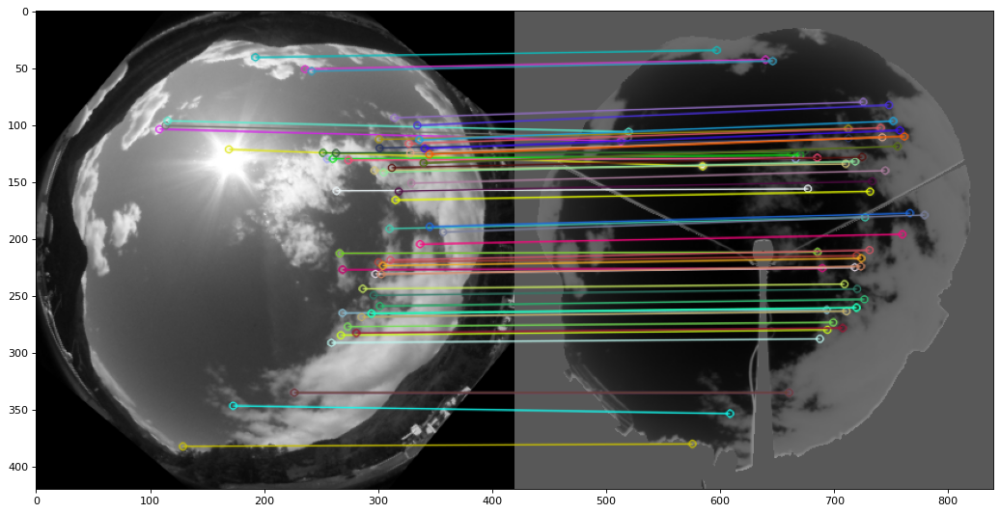

In [56]:
src_pts = np.float32([ kp_vis[m.queryIdx].pt for m in close_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_ir[m.trainIdx].pt for m in close_matches ]).reshape(-1,1,2)

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 10.0)
draw_params = dict(matchesMask=mask.ravel().tolist(), flags=2)
close_match_img = cv2.drawMatches(img_vis,kp_vis,img_ir,kp_ir,close_matches,None, **draw_params)
plot_img(close_match_img)

### Comment
Yay, it works!

## Warp perspective

In [57]:
def plot_overlay(img1, img2):
    img1_color = np.zeros((img1.shape[0], img1.shape[1], 3), dtype=np.uint8)
    img1_color[:, :, 2] = img1
    img2_color = np.zeros((img2.shape[0], img2.shape[1], 3), dtype=np.uint8)
    img2_color[:, :, 1] = img2
    overlay = cv2.addWeighted(img1_color, 0.5, img2_color, 0.5, 0)
    plot_img(overlay)

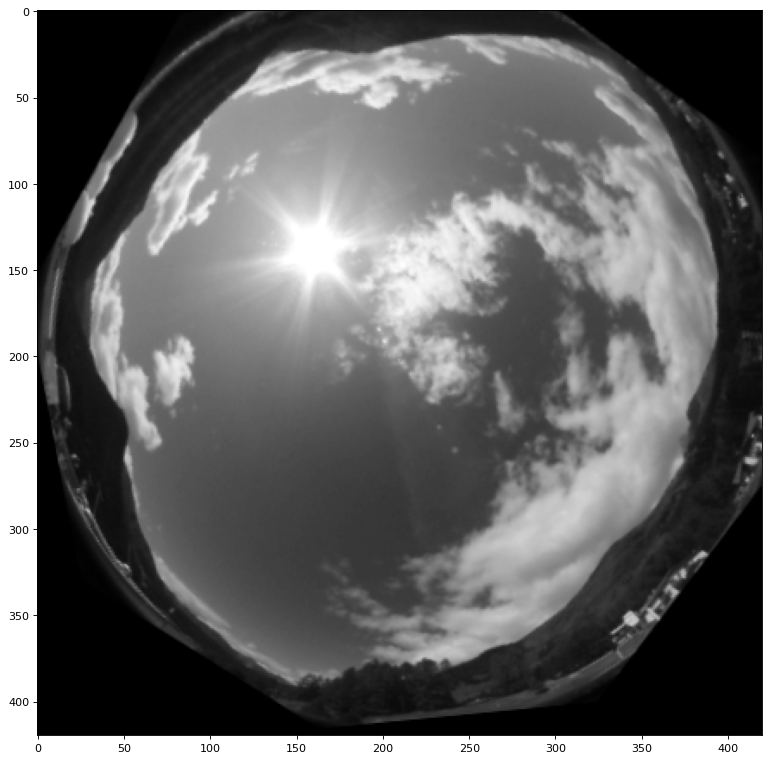

In [58]:
warped = cv2.warpPerspective(img_vis, M, (img_vis.shape[0], img_vis.shape[1]))
plot_img(warped)

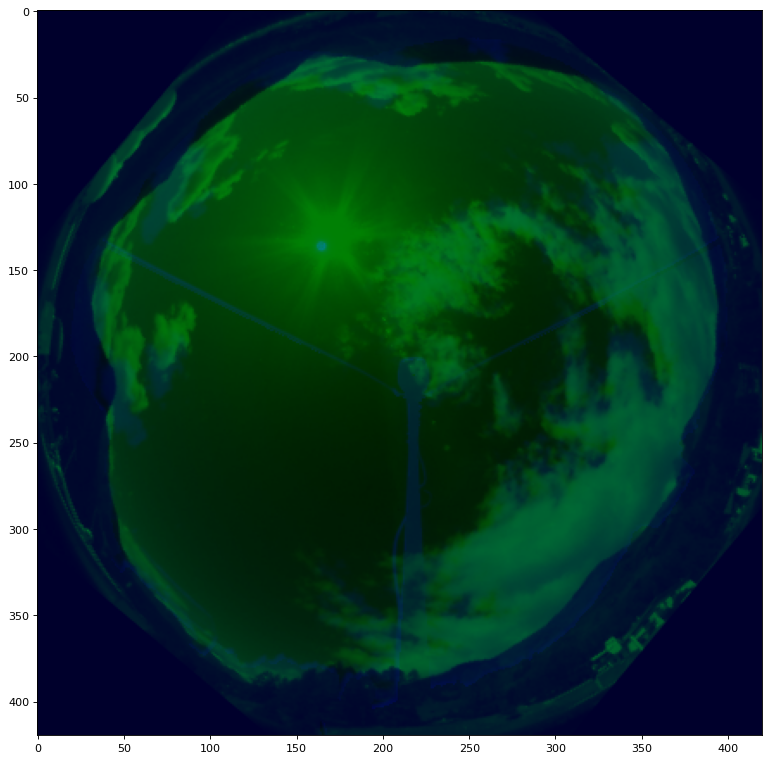

In [59]:
plot_overlay(img_ir, img_vis)

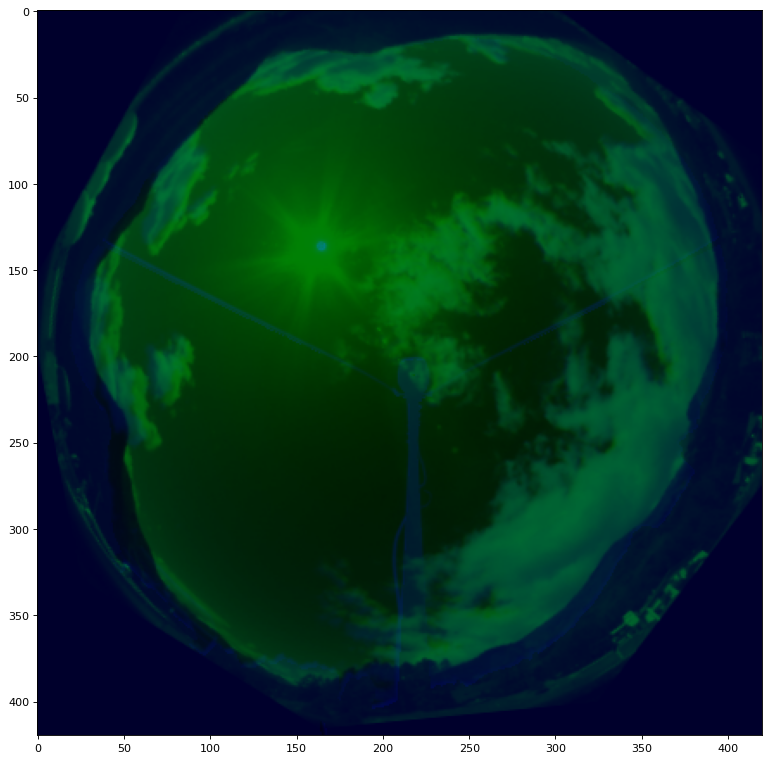

In [60]:
plot_overlay(img_ir, warped)

### Comment
This looks great. I tried ealier with an image that had many matches on one side of the image, but very few on the other, and the warp did not work well on the side with few matches. So we should probably aggregate the warps over a few images and use that as the final transformation matrix. We can get matches from multiple images and calculate the homography using all of them together.

## Same tranformation matrix on different image

In [61]:
img_ir_500 = get_processed_ir_img(500)
img_vis_500 = get_processed_vis_img(500)

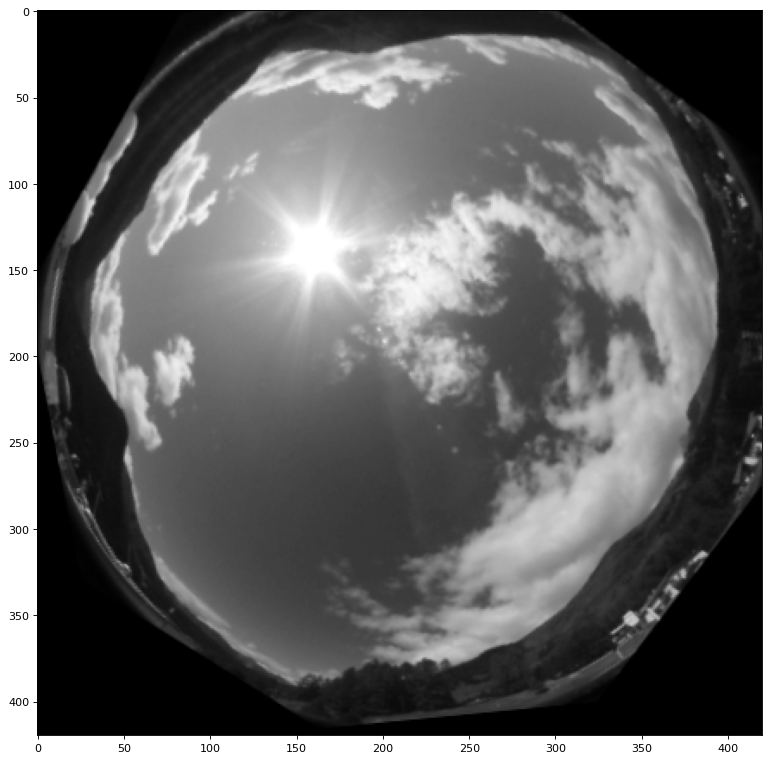

In [62]:
warped_500 = cv2.warpPerspective(img_vis_500, M, (img_vis.shape[0], img_vis.shape[1]))
plot_img(warped)

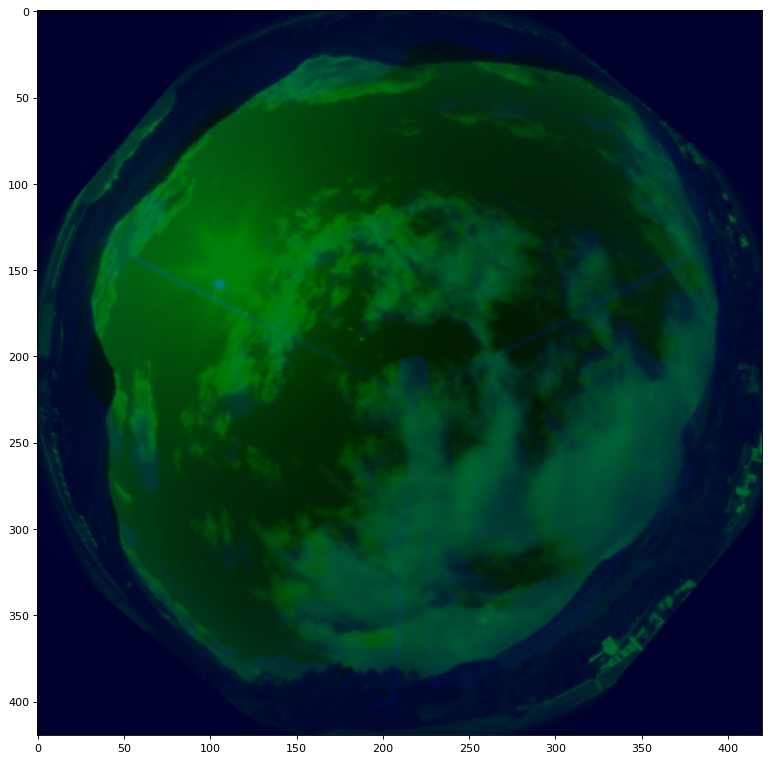

In [63]:
plot_overlay(img_ir_500, img_vis_500)

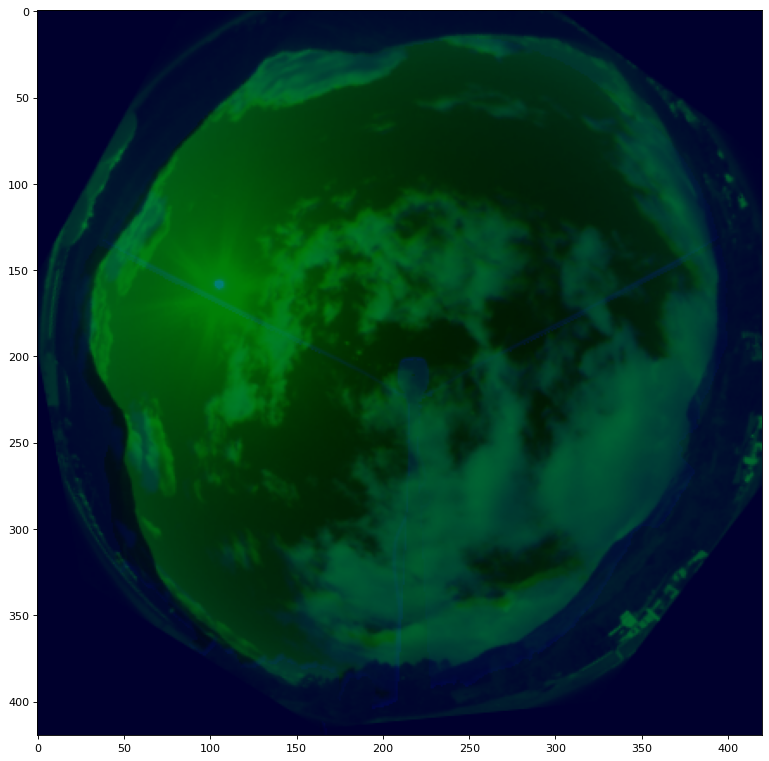

In [64]:
plot_overlay(img_ir_500, warped_500)

## Comment
Works well

In [66]:
img_vis_500

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)